<div style="color:#FF1F26;
           display:fill;
           border-style: solid;
           border-color:#C1C1C1;
           font-size:16px;
           font-family:Calibri;
           background-color:#B75351;">
<h2 style="text-align: center;
           padding: 10px;
           color:#FFFFFF;">
======= Plant Disease Classification using CNN & TransfearLearning with 95%+ Accuracy =======
</h2>
</div>


<div style="padding:10px;
            color:white;
            margin:5;
            font-size:170%;
            text-align:left;
            display:fill;
            border-radius:15px;
            background-color:#294B8E;
            overflow:hidden;
            font-weight:700"> Table of Contents</div>


<a id="toc"></a>

- [1. Setup](#1)
  - [1.1. Package and Library](#1.1)
  - [1.2. Load the Data](#1.2)
- [2. Data Explorations](#2)
- [3. Image Processing](#3)
- [4. Spliting](#4)
- [5. CNN Model](#5)
- [6. Transfear Learning](#6)
- [7. Evaluation](#7)
- [8. Predected Images](#8)


# <a id="1"></a>

<div style="padding:10px;
            color:white;
            margin:5;
            font-size:170%;
            text-align:left;
            display:fill;
            border-radius:15px;
            background-color:#294B8E;
            overflow:hidden;
            font-weight:700">1. Setup</div>


<a id="1.1"></a>

# <b><span style='color:#8D6D9B'>1.1. Package and Library</span></b>


In [1]:
import os
import pandas as pd 
import numpy as np 
import seaborn as sns
import matplotlib.pyplot as plt
import cv2 
import tensorflow as tf
import random
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report , confusion_matrix

from tqdm import tqdm
from keras.layers import Conv2D, MaxPooling2D , BatchNormalization ,Dropout ,Flatten , Dense , Input
from tensorflow.keras.applications import VGG16
from keras.models import Sequential

import warnings

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    
plt.style.use('ggplot')

<a id="1.2"></a>

# <b><span style='color:#8D6D9B'>1.2. Load The Data</span></b>


In [2]:
dataDir = 'datasets\Pepper__bell'
selectedClasses = ['Pepper__bell___healthy',
                   'Pepper__bell___Bacterial_spot',]

In [3]:
imgPaths = []
labels = []
for className in os.listdir(dataDir):
    if className in selectedClasses :                  # Select you classes above
        classPath = os.path.join(dataDir,className)
        for img in os.listdir(classPath):
            imgPath = os.path.join(classPath,img)
            imgPaths.append(imgPath)
            labels.append(className)
            
# Convert the 2 lists to dataframe to easy use 
df = pd.DataFrame({
    'imgPath':imgPaths,
    'label':labels
})

df = df.sample(frac=1).reset_index(drop=True)            # Shuffle

df

,imgPath,label
0,datasets\Pepper__bell\Pepper__bell___Bacterial...,Pepper__bell___Bacterial_spot
1,datasets\Pepper__bell\Pepper__bell___Bacterial...,Pepper__bell___Bacterial_spot
2,datasets\Pepper__bell\Pepper__bell___Bacterial...,Pepper__bell___Bacterial_spot
3,datasets\Pepper__bell\Pepper__bell___healthy\9...,Pepper__bell___healthy
4,datasets\Pepper__bell\Pepper__bell___healthy\c...,Pepper__bell___healthy
...,...,...
2470,datasets\Pepper__bell\Pepper__bell___healthy\a...,Pepper__bell___healthy
2471,datasets\Pepper__bell\Pepper__bell___Bacterial...,Pepper__bell___Bacterial_spot
2472,datasets\Pepper__bell\Pepper__bell___healthy\a...,Pepper__bell___healthy
2473,datasets\Pepper__bell\Pepper__bell___Bacterial...,Pepper__bell___Bacterial_spot


In [4]:
len(df)

2475

# <a id="2"></a>

<div style="padding:10px;
            color:white;
            margin:5;
            font-size:170%;
            text-align:left;
            display:fill;
            border-radius:15px;
            background-color:#294B8E;
            overflow:hidden;
            font-weight:700">2. Data Explorations</div>


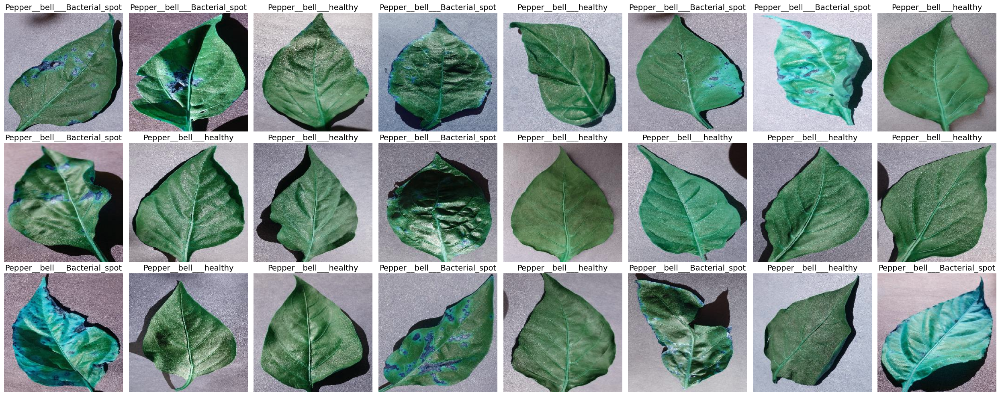

In [5]:
fig, axs = plt.subplots(3, 8, figsize=(25, 10))  # 3 rows, 5 columns

axs = axs.flatten()

for i in range(24):
    index = random.choice(df.index)
    imgPath = df.iloc[index]['imgPath']
    label = df.iloc[index]['label']
    img = cv2.imread(imgPath)
    axs[i].imshow(img)
    axs[i].set_title(label , fontsize=14)
    axs[i].axis('off')
    
plt.tight_layout()
plt.show()

# <a id="3"></a>

<div style="padding:10px;
            color:white;
            margin:5;
            font-size:170%;
            text-align:left;
            display:fill;
            border-radius:15px;
            background-color:#294B8E;
            overflow:hidden;
            font-weight:700">3. Image Processing</div>


In [6]:
df['label'] = df['label'].replace({'Pepper__bell___healthy':0,
                                    'Pepper__bell___Bacterial_spot':1,
                                    }).astype(int)

C:\Users\sarth\AppData\Local\Temp\ipykernel_2152\2953948332.py:1: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df['label'] = df['label'].replace({'Pepper__bell___healthy':0,


In [7]:
IMG_SIZE = (150,150)   # to free some resources and reduce the execution time
imgs = []
for imgPath in tqdm(df['imgPath'], total=len(df)):
    img = cv2.imread(imgPath)
    img = cv2.cvtColor(img , cv2.COLOR_BGR2RGB)
    img = cv2.resize(img, IMG_SIZE)
    imgs.append(img)

100%|██████████| 2475/2475 [00:04<00:00, 559.76it/s]


All the images has the same shape


In [8]:
# convert them to numpy array to we can split them 
images = np.array(imgs)
labels = np.array(df['label'])

len(images) , len(labels)

(2475, 2475)

In [9]:
images = images / 255.0         # normalize from 0 --> 255 to 0 --> 1  to reduce the execution time 

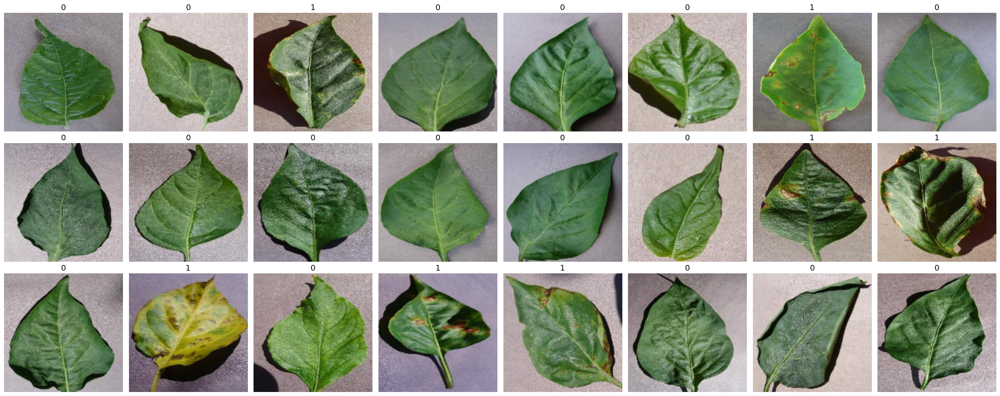

In [10]:
# Plot some images after encoding and resizing 
fig, axs = plt.subplots(3, 8, figsize=(25, 10))

axs = axs.flatten()

for i in range(24):
    index = random.choice(df.index)
    img = images[index]
    label = labels[index]
    axs[i].imshow(img)
    axs[i].set_title(label, fontsize=14)
    axs[i].axis('off')
    

plt.tight_layout()
plt.show()

# <a id="4"></a>

<div style="padding:10px;
            color:white;
            margin:5;
            font-size:170%;
            text-align:left;
            display:fill;
            border-radius:15px;
            background-color:#294B8E;
            overflow:hidden;
            font-weight:700">4. Spliting</div>


In [11]:
# Spliting 

X_train, X_test, y_train, y_test = train_test_split(images, labels, test_size=0.2, random_state=42 ,shuffle=True)

print(f'Shape of X_train : {X_train.shape}')
print(f'Shape of X_test : {X_test.shape}')
print(f'Shape of y_train : {y_train.shape}')
print(f'Shape of y_test : {y_test.shape}')

Shape of X_train : (1980, 150, 150, 3)
Shape of X_test : (495, 150, 150, 3)
Shape of y_train : (1980,)
Shape of y_test : (495,)


# <a id="5"></a>

<div style="padding:10px;
            color:white;
            margin:5;
            font-size:170%;
            text-align:left;
            display:fill;
            border-radius:15px;
            background-color:#294B8E;
            overflow:hidden;
            font-weight:700">5. CNN Model</div>


In [12]:
with tf.device('/GPU:0'):
    kerasModel = Sequential([
        Conv2D(filters = 32 , kernel_size=(3,3) , strides=(1,1) , padding='VALID' ,input_shape=(150,150,3)), # padding ='SAME' for using padding
        MaxPooling2D(pool_size=(2,2),strides=(2,2)),
        BatchNormalization(),
        Dropout(0.1),

        Conv2D(filters = 32 , kernel_size=(3,3) , strides=(1,1) , padding='VALID'),
        MaxPooling2D(pool_size=(2,2),strides=(2,2)),
        BatchNormalization(),
        Dropout(0.1),

        Conv2D(filters = 32 , kernel_size=(3,3) , strides=(1,1) , padding='VALID'),
        MaxPooling2D(pool_size=(2,2),strides=(2,2)),
        BatchNormalization(),
        Dropout(0.1),
        
        Conv2D(filters = 32 , kernel_size=(3,3) , strides=(1,1) , padding='VALID'),
        MaxPooling2D(pool_size=(2,2),strides=(2,2)),
        BatchNormalization(),
        Dropout(0.1),
        
        Conv2D(filters = 32 , kernel_size=(3,3) , strides=(1,1) , padding='VALID'),
        MaxPooling2D(pool_size=(2,2),strides=(2,2)),
        BatchNormalization(),
        Dropout(0.1),
        Flatten(),

        Dense(128,activation='relu'),
        Dense(6 ,activation='softmax')
    ])

c:\Users\sarth\AppData\Local\Programs\Python\Python311\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [13]:
kerasModel.compile(optimizer='adam',loss='sparse_categorical_crossentropy' ,metrics=['accuracy'])

In [14]:
history = kerasModel.fit(X_train,y_train,
                         validation_split = 0.2 , #validation_data=(X_test,y_test),
                         epochs=10,
                         batch_size=50, 
                         verbose=1,
                         callbacks=[tf.keras.callbacks.EarlyStopping(
                                            patience=5,
                                            monitor='val_accuracy',
                                            restore_best_weights=True)])

Epoch 1/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 23s 473ms/step - accuracy: 0.6821 - loss: 0.8464 - val_accuracy: 0.6364 - val_loss: 0.8000
Epoch 2/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 14s 432ms/step - accuracy: 0.8965 - loss: 0.2675 - val_accuracy: 0.6869 - val_loss: 0.6308
Epoch 3/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 14s 434ms/step - accuracy: 0.9379 - loss: 0.1676 - val_accuracy: 0.6843 - val_loss: 0.5925
Epoch 4/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 14s 434ms/step - accuracy: 0.9638 - loss: 0.1042 - val_accuracy: 0.6768 - val_loss: 0.6691
Epoch 5/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 14s 428ms/step - accuracy: 0.9622 - loss: 0.1043 - val_accuracy: 0.7727 - val_loss: 0.4249
Epoch 6/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 14s 426ms/step - accuracy: 0.9760 - loss: 0.0641 - val_accuracy: 0.7955 - val_loss: 0.3931
Epoch 7/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 14s 427ms/step - accuracy: 0.9754 - loss: 0.0692 - val_accuracy: 0.8662 - val_loss: 0.2780
Epoch 8/10
32/32 ━━━━━━━━━━━━━━━━━━━━ 14s 428ms/step - accuracy: 0.9782 - loss: 0.0600 - val_accu

In [15]:
y_pred = kerasModel.predict(X_test)

16/16 ━━━━━━━━━━━━━━━━━━━━ 2s 89ms/step


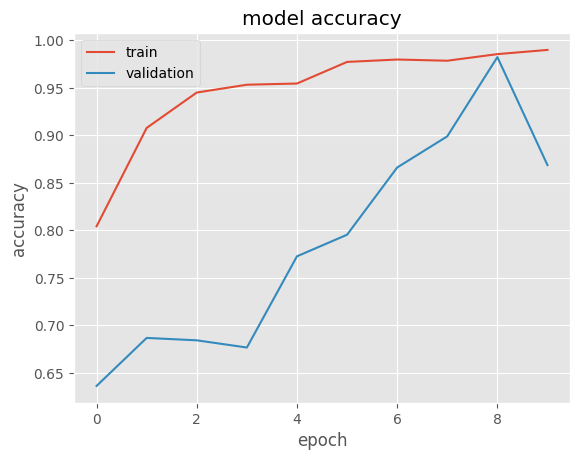

In [16]:
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='upper left')
plt.show()

In [17]:
y_test[:10]

array([0, 0, 0, 0, 1, 0, 0, 1, 0, 0])

In [18]:
new_y_pred = [np.argmax(x) for x in y_pred]
new_y_pred[:10]

[0, 0, 0, 0, 1, 0, 0, 1, 0, 0]

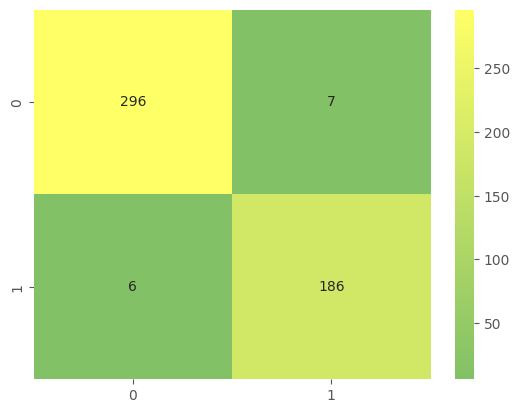

In [19]:
CM = confusion_matrix(y_test, new_y_pred)
sns.heatmap(CM, center = True,cmap='summer',annot=True ,fmt='.5g')
plt.show()

In [20]:
ClassificationReport = classification_report(y_test,new_y_pred)
print('Classification Report is : \n', ClassificationReport )

Classification Report is : 
               precision    recall  f1-score   support

           0       0.98      0.98      0.98       303
           1       0.96      0.97      0.97       192

    accuracy                           0.97       495
   macro avg       0.97      0.97      0.97       495
weighted avg       0.97      0.97      0.97       495



# <a id="6"></a>

<div style="padding:10px;
            color:white;
            margin:5;
            font-size:170%;
            text-align:left;
            display:fill;
            border-radius:15px;
            background-color:#294B8E;
            overflow:hidden;
            font-weight:700">6. Transfear Learning</div>


We will use VGG16 pretrained model


In [21]:
custom_input = Input(shape=(150, 150, 3))           # To customize the input shape of PreTrained model  

with tf.device('/GPU:0'):          # to use GPU
    Model = Sequential([

        VGG16(weights='imagenet', include_top=False, input_tensor=custom_input),
        
        Flatten(),                                     # because we ignore the flatten and dense layers when include_top = False 
        
        Dense(128,activation='relu'),
        
        Dropout(0.2),

        Dense(6 ,activation='softmax')
    ])

In [22]:
VGG16Layers = Model.layers[0]
for layer in VGG16Layers.layers[1:-3]:           # freez all layers except the first and last 3 layers, we will make them trainable (weghts changes with training)
    layer.trainable = False

In [23]:
Model.compile(optimizer='adam',loss='sparse_categorical_crossentropy' ,metrics=['accuracy'])

In [24]:
history = Model.fit(X_train,y_train,
                         validation_split = 0.2 , #validation_data=(X_test,y_test),
                         epochs=10,
                         batch_size=100, 
                         verbose=1,
                         callbacks=[tf.keras.callbacks.EarlyStopping(
                                            patience=5,
                                            monitor='val_accuracy',
                                            restore_best_weights=True)])

Epoch 1/10


c:\Users\sarth\AppData\Local\Programs\Python\Python311\Lib\site-packages\keras\src\models\functional.py:225: UserWarning: The structure of `inputs` doesn't match the expected structure: ['keras_tensor_24']. Received: the structure of inputs=*
  warnings.warn(


16/16 ━━━━━━━━━━━━━━━━━━━━ 116s 7s/step - accuracy: 0.4780 - loss: 1.8545 - val_accuracy: 0.7601 - val_loss: 0.5451
Epoch 2/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 104s 7s/step - accuracy: 0.8173 - loss: 0.4258 - val_accuracy: 0.8889 - val_loss: 0.2619
Epoch 3/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 106s 7s/step - accuracy: 0.8988 - loss: 0.2423 - val_accuracy: 0.9369 - val_loss: 0.1895
Epoch 4/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 106s 7s/step - accuracy: 0.9446 - loss: 0.1613 - val_accuracy: 0.9520 - val_loss: 0.1265
Epoch 5/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 104s 7s/step - accuracy: 0.9563 - loss: 0.1088 - val_accuracy: 0.9571 - val_loss: 0.1076
Epoch 6/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 106s 7s/step - accuracy: 0.9854 - loss: 0.0433 - val_accuracy: 0.9697 - val_loss: 0.0843
Epoch 7/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 107s 7s/step - accuracy: 0.9860 - loss: 0.0356 - val_accuracy: 0.9419 - val_loss: 0.1838
Epoch 8/10
16/16 ━━━━━━━━━━━━━━━━━━━━ 105s 7s/step - accuracy: 0.9722 - loss: 0.0662 - val_accuracy: 0.9646 - val_loss: 0.

In [25]:
Model.summary()

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ vgg16 (Functional)              │ (None, 4, 4, 512)      │    14,714,688 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_1 (Flatten)             │ (None, 8192)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 128)            │     1,048,704 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_5 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 6)              │           774 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 27,302,356 (104.15 MB)

 Trainable params: 5,769,094 (22.01 MB)

 Non-trainable params: 9,995,072 (38.13 MB)

 Optimizer params: 11,538,190 (44.01 MB)

# <a id="7"></a>

<div style="padding:10px;
            color:white;
            margin:5;
            font-size:170%;
            text-align:left;
            display:fill;
            border-radius:15px;
            background-color:#294B8E;
            overflow:hidden;
            font-weight:700">7. Evaluation</div>


In [26]:
y_pred = Model.predict(X_test)

16/16 ━━━━━━━━━━━━━━━━━━━━ 29s 2s/step


In [ ]:
print(f'Prediction items : \n{y_pred[:5]}')

Prediction items : 
[[9.9949610e-01 5.0315965e-04 4.5573188e-08 1.7235773e-07 2.5858231e-08
  5.0472227e-07]
 [9.9602169e-01 3.9764699e-03 9.2563276e-08 2.0383727e-07 1.5862412e-07
  1.3688768e-06]
 [9.9783319e-01 2.1640181e-03 1.6836377e-07 3.8937986e-07 2.4060208e-07
  2.0856307e-06]
 [9.9979419e-01 2.0555900e-04 1.5016504e-08 3.0497070e-08 1.6077939e-08
  2.5485957e-07]
 [3.1726044e-02 9.6822351e-01 1.3906649e-05 6.6761932e-06 3.0526512e-06
  2.6802187e-05]]


In [28]:
print(f'Prediction items after rounding :  \n{np.round(y_pred[:5])}')

Prediction items after rounding :  
[[1. 0. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0.]
 [0. 1. 0. 0. 0. 0.]]


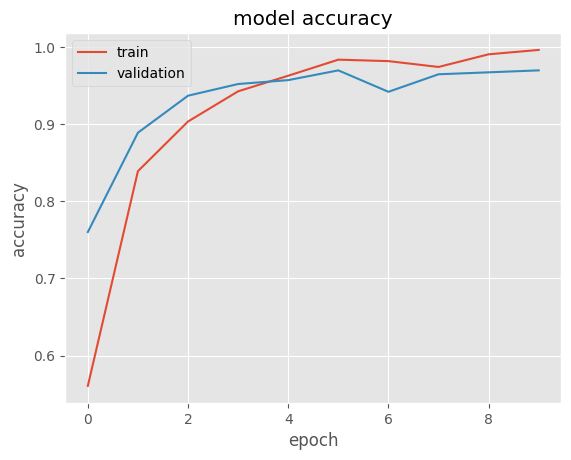

In [29]:
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='upper left')
plt.show()

In [30]:
y_test[:10]

array([0, 0, 0, 0, 1, 0, 0, 1, 0, 0])

In [31]:
new_y_pred = [np.argmax(x) for x in y_pred]
new_y_pred[:10]

[0, 0, 0, 0, 1, 0, 0, 1, 0, 0]

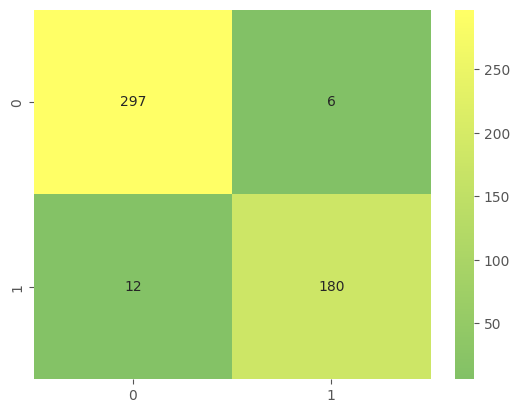

In [32]:
CM = confusion_matrix(y_test, new_y_pred)
sns.heatmap(CM, center = True,cmap='summer',annot=True ,fmt='.5g')
plt.show()

In [33]:
ClassificationReport = classification_report(y_test,new_y_pred)
print('Classification Report is : \n', ClassificationReport )

Classification Report is : 
               precision    recall  f1-score   support

           0       0.96      0.98      0.97       303
           1       0.97      0.94      0.95       192

    accuracy                           0.96       495
   macro avg       0.96      0.96      0.96       495
weighted avg       0.96      0.96      0.96       495



# <a id="8"></a>

<div style="padding:10px;
            color:white;
            margin:5;
            font-size:170%;
            text-align:left;
            display:fill;
            border-radius:15px;
            background-color:#294B8E;
            overflow:hidden;
            font-weight:700">8. Predected Images</div>


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 170ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 172ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 193ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 170ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 241ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 224ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 172ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 182ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 195ms/step


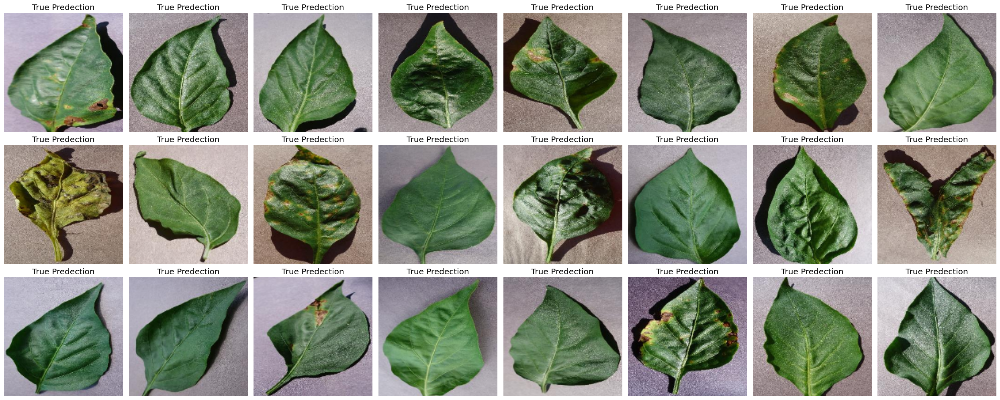

In [34]:
# Plot some images after encoding and resizing 
fig, axs = plt.subplots(3, 8, figsize=(25, 10))

axs = axs.flatten()

for i in range(24):
    index = random.choice(range(len(X_test)))
    img = X_test[index]
    label = y_test[index]
    reshapedImg = img.reshape(1,150,150,3)
    pred = np.argmax(Model.predict(reshapedImg))
    isPredectedTrue = 'True' if (label == pred) else 'False'
    axs[i].imshow(img)
    axs[i].set_title(f'{isPredectedTrue} Predection')
    axs[i].axis('off')
    
plt.tight_layout()
plt.subplots_adjust(hspace=0.1)
plt.show()

### If these kernels impress you,give them an <font size="+3" color="red"><b>Upvote</b></font>.<br>


<a href="#toc" class="btn btn-success btn-lg active" role="button" aria-pressed="true" style="color:white" data-toggle="popover" title="go to Colors">Go to TOP</a>
